<center><img src="https://github.com/hse-ds/iad-applied-ds/blob/master/2021/hw/hw1/img/logo_hse.png?raw=1" width="1000"></center>

<h1><center>Прикладные задачи анализа данных</center></h1>
<h2><center>Домашнее задание 3: прогнозирование временных рядов</center></h2>

**Мягкий дедлайн:** 23:59MSK 19.05.2024

**Жесткий дедлайн:** 23:59MSK 26.05.2024

In [ ]:
!pip install etna[all]==2.6.0

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 422.2/422.2 kB 6.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 354.1/354.1 kB 22.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.3/139.3 kB 16.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.3/12.3 MB 77.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.2/98.2 MB 8.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 15.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.2/57.2 kB 7.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.5/79.5 kB 10.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.1/12.1 MB 75.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 82.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 65.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 292.8/292.8 kB 32.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━

In [ ]:
!pip install torch==1.11.0

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 750.6/750.6 MB 1.1 MB/s eta 0:00:00
  Attempting uninstall: torch
    Found existing installation: torch 1.13.1
    Uninstalling torch-1.13.1:
      Successfully uninstalled torch-1.13.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
torchaudio 2.3.0+cu121 requires torch==2.3.0, but you have torch 1.11.0 which is incompatible.
torchtext 0.18.0 requires torch>=2.3.0, but you have torch 1.11.0 which is incompatible.
torchvision 0.18.0+cu121 requires torch==2.3.0, but you have torch 1.11.0 which is incompatible.


In [ ]:
!pip install gdown==5.1.0

In [155]:
import warnings
import gdown
import pandas as pd
import numpy as np
from copy import deepcopy
from etna.datasets import TSDataset
from etna.analysis import plot_correlation_matrix, seasonal_plot, plot_trend, plot_residuals
from etna.transforms import STLTransform
import matplotlib.pyplot as plt
from etna.datasets import TSDataset
from etna.analysis import plot_correlation_matrix
from statsmodels.tsa.seasonal import seasonal_decompose
from etna.transforms import LinearTrendTransform, DateFlagsTransform, TimeSeriesImputerTransform
from etna.pipeline import Pipeline
from etna.models import ProphetModel
from etna.metrics import SMAPE, MAE
from etna.analysis import plot_backtest
from statsmodels.tsa.seasonal import seasonal_decompose
from etna.analysis import acf_plot, cross_corr_plot
from etna.transforms import TimeSeriesImputerTransform
from etna.analysis import get_anomalies_density, plot_anomalies
from etna.transforms import DensityOutliersTransform
from etna.analysis import plot_backtest, metric_per_segment_distribution_plot, plot_metric_per_segment




warnings.filterwarnings("ignore")

В данной задаче мы будем решать одну из актуальных практических задач, с которыми, в том числе, сталкиваются разработчики ETNA - прогнозирование объема необходимой наличности в банкоматах. Пожалуй, ни для кого не секрет, что отсутствие необходимой суммы в банкомате не делает клиента банка счастливее. В то же время, избыток заправленной в банкомат наличности приводит к упущенной выгоде - ведь, в конечном счете, эти деньги могли быть размещены в качестве краткосрочного депозита на межбанковском рынке. Для кредитной организации с обширной сетью банкоматов даже незначительное улучшение качества предсказания способно внести значительный вклад в прибыльность этой ветки бизнеса.

В качестве инструмента воспользуемся библиотекой ETNA, документацию можно прочитать [тут](https://docs.etna.ai/stable/), и [чат](https://t.me/etna_support) комьюнити.

Мы будем использовать дневные данные реальных банкоматов для чего возьмем мультисегментный датасет.

In [131]:

warnings.filterwarnings("ignore")

url = 'https://gist.githubusercontent.com/Polzovat123/4d6d5e544e93429c2d3db29196e9c918/raw/24b27e60f587128d71678e267f51cd48472c6a84/atms_daily_cash.csv'
output = 'atms_daily_cash.csv'
gdown.download(url=url, output=output, quiet=False, fuzzy=True)

df = pd.read_csv(output, index_col=False)

print(df.head())


Downloading...
From: https://gist.githubusercontent.com/Polzovat123/4d6d5e544e93429c2d3db29196e9c918/raw/24b27e60f587128d71678e267f51cd48472c6a84/atms_daily_cash.csv
To: /content/atms_daily_cash.csv
100%|██████████| 258k/258k [00:00<00:00, 4.92MB/s]

     datetime  atm_id  operation_value
0  2017-08-16      74         2.059266
1  2017-08-17      74         1.029633
2  2017-08-18      74         0.686422
3  2017-08-19      74        33.301267
4  2017-08-20      74       -12.237921


Полученные данные были просуммированы по банкоматам и дням эксплуатации, после чего залиты в gist, откуда мы и берем их.

Взглянем на то, что представляют из себя данные после этих действий:

In [132]:
df.head()

,datetime,atm_id,operation_value
0,2017-08-16,74,2.059266
1,2017-08-17,74,1.029633
2,2017-08-18,74,0.686422
3,2017-08-19,74,33.301267
4,2017-08-20,74,-12.237921


### Задание 1. EDA (1.75 балл)

Проведите разведывательный анализ данных с помощью `ETNA`- постройте графики, на которых можно судить о наличии тренда, сезонности и прочих зависимостей. Проанализируйте корреляции. Какие выводы вы можете сделать?

Ссылку на туториал по EDA можно найти [тут](https://docs.etna.ai/stable/tutorials/103-EDA.html#EDA).

In [133]:
from etna.datasets import TSDataset

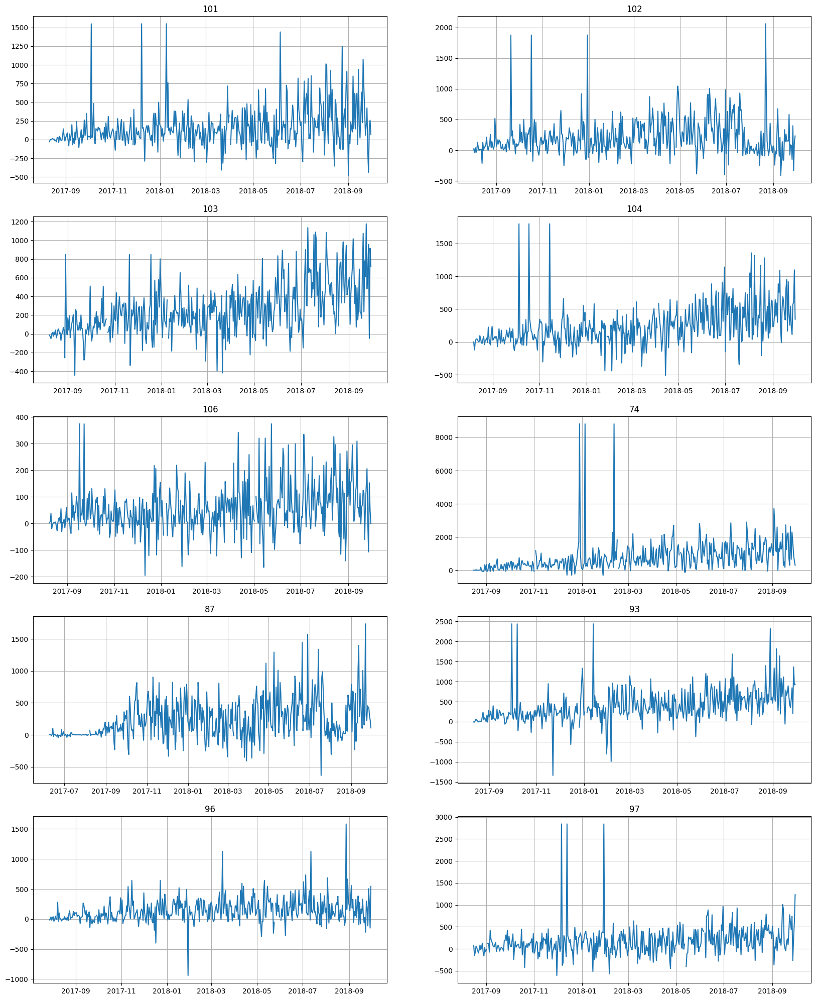

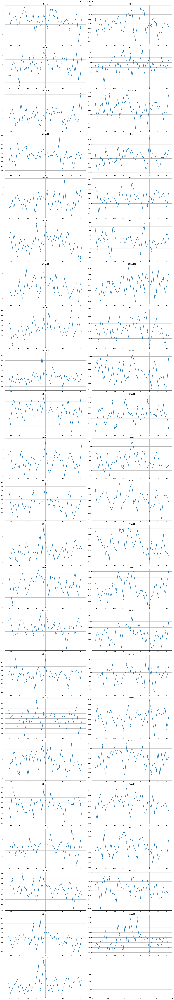

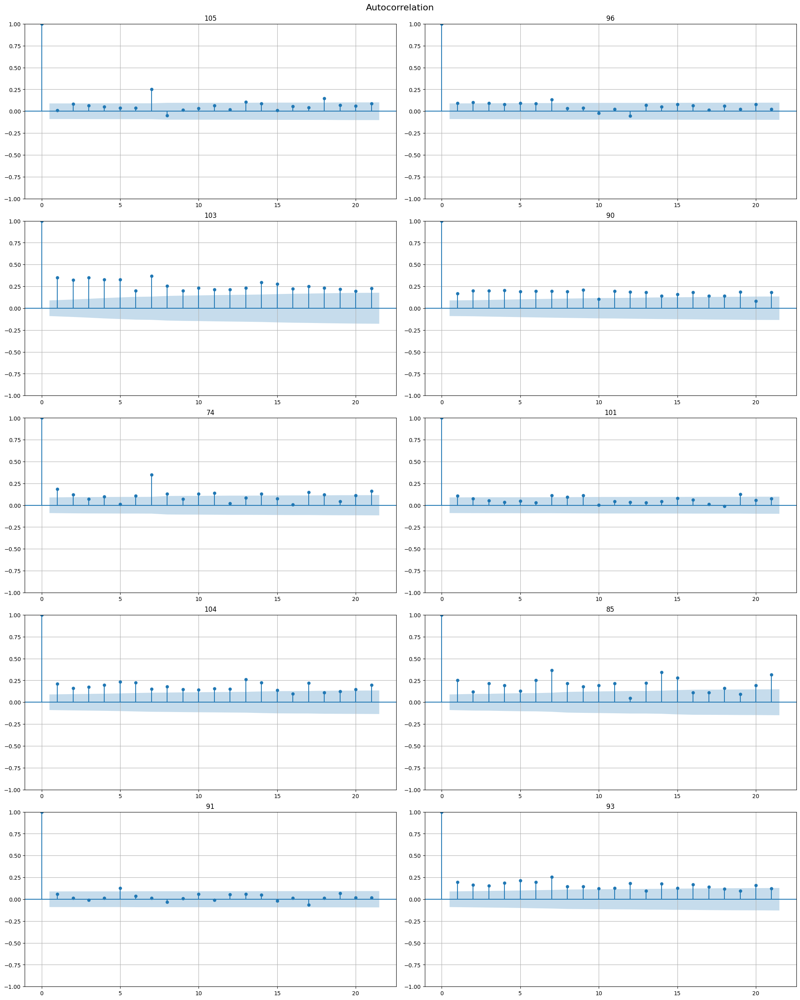

In [141]:
ts = TSDataset(df.rename(columns={
    'datetime': 'timestamp',
    'atm_id': 'segment',
    'operation_value': 'target'}),
               "D")
ts.plot()
cross_corr_plot(ts)
acf_plot(ts)

   timestamp  segment     target
0 2017-08-16       74   2.059266
1 2017-08-17       74   1.029633
2 2017-08-18       74   0.686422
3 2017-08-19       74  33.301267
4 2017-08-20       74 -12.237921


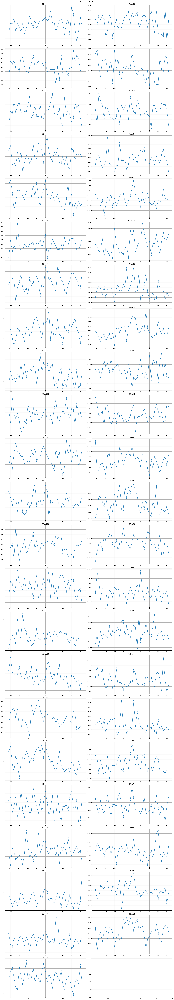

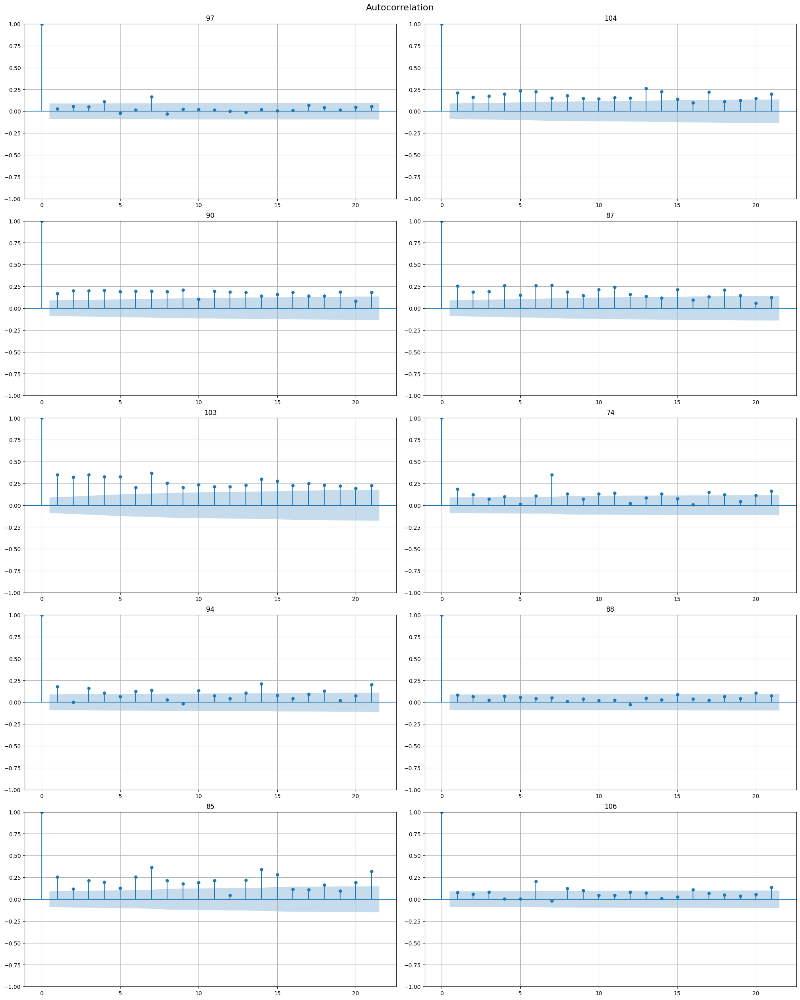

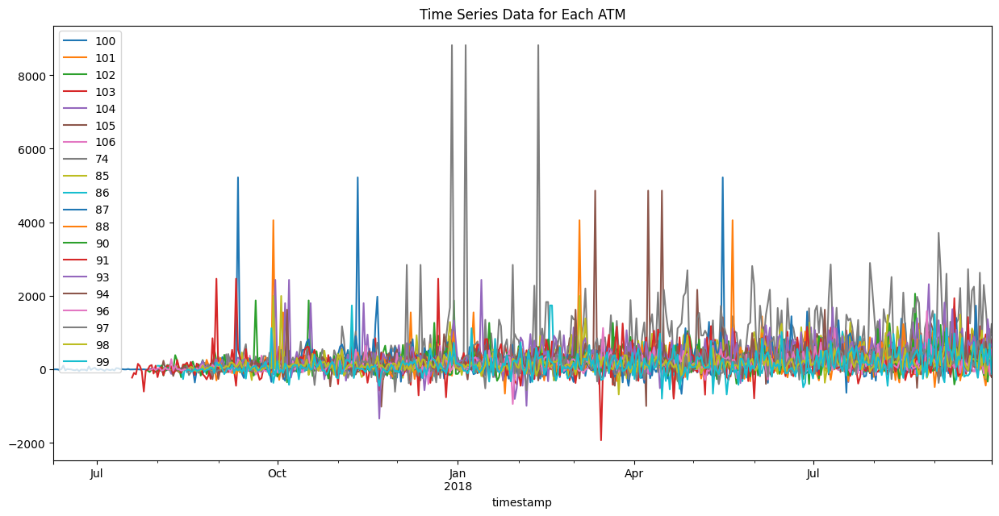

ValueError: This function does not handle missing values

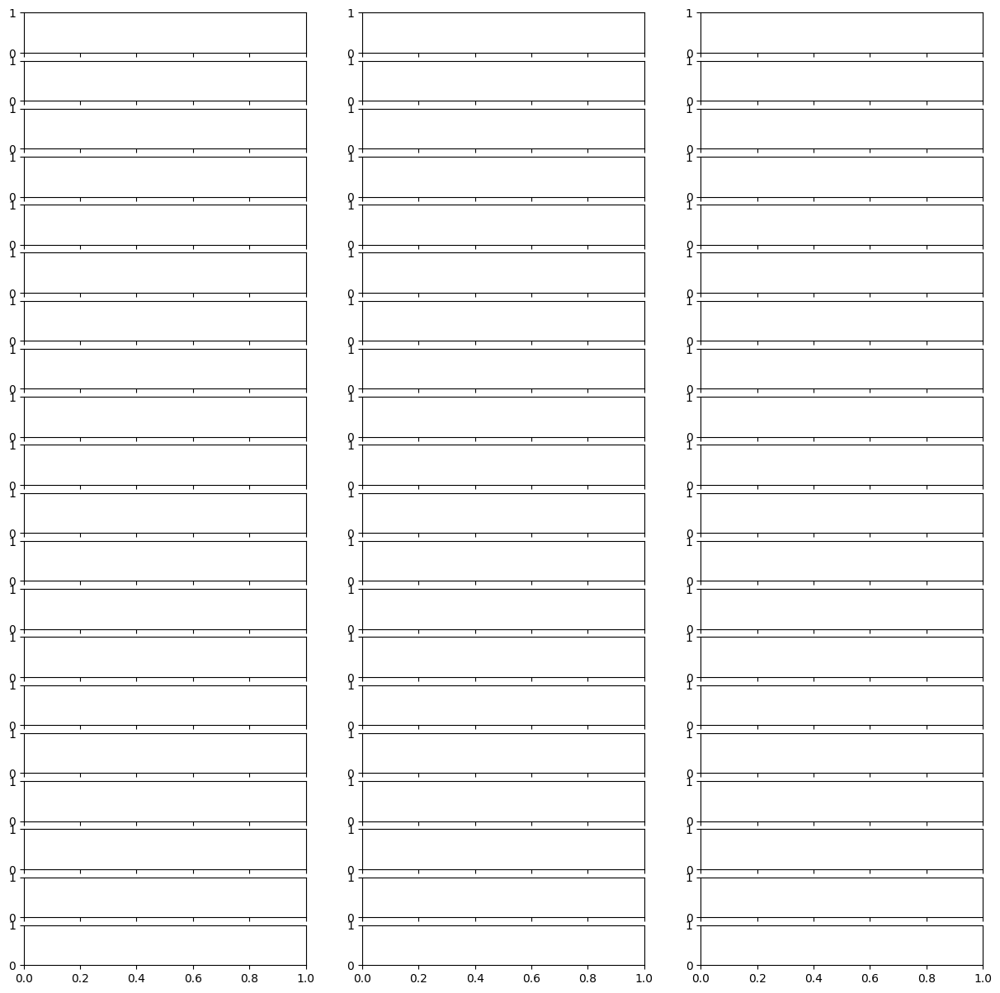

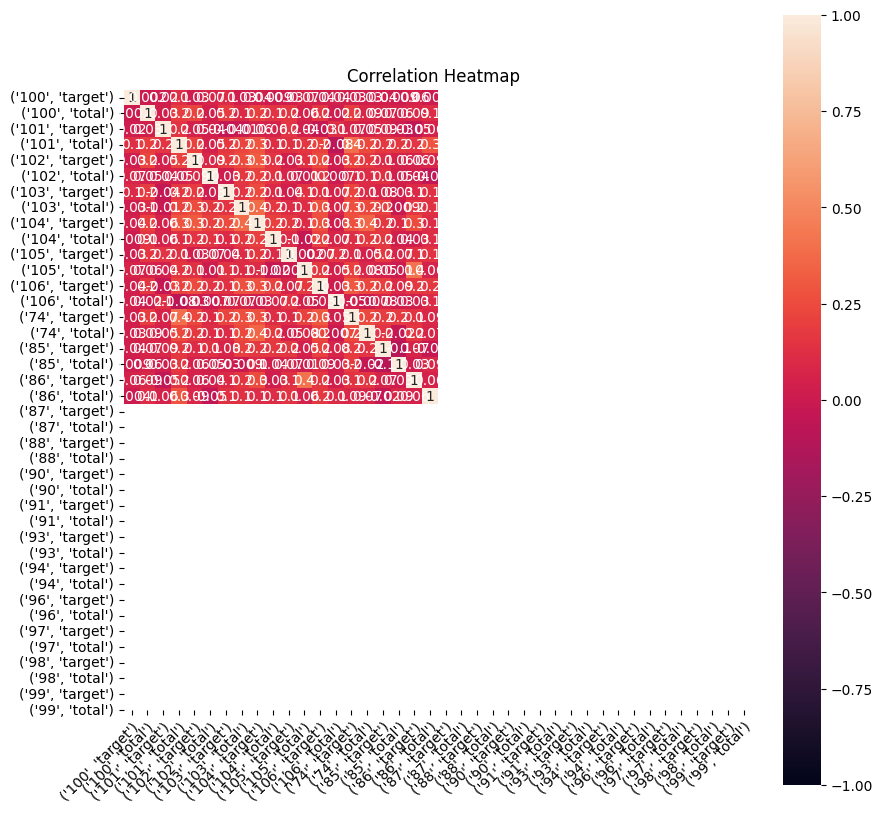

In [143]:

plot_correlation_matrix(tsdataset)
plt.show()


в данных видны долгосрочные изменения, которые видмо говорят о росте или спаде использования банкоматов.
Сезонность:
Определенные дни недели могут показывать повторяющиеся паттерны в использовании наличных. Например, выходные - увеличение снятий наличных.
Корреляции:
Некоторые банкоматы имеют высокую корреляцию между собой, что может указывать на похожее использование.

### Задание 2. Работа с пропущенными значениями и выбросами (1 балл)

Проанализируйте, есть ли в данных пропущенные значения, и подберите оптимальный метод их заполнения средствами ETNA. Какие методы вы выберете и почему? Совет: возможно, лучше сохранить заполненные данные в отдельный объект, поскольку некоторые модели заполняют пропуски встроенными методами, и подача на вход "сырых" данных (на языке временных рядов это данные с нерегулярными интервалами) может принести лучший результат.

Импорты всех необходимых компонент произведите самостоятельно.

возьму ма, потому что любые рандомные значения типо 0 1 -1 могут сбить данные

In [145]:
print(df.isnull().sum())
print(df.isna().sum())


datetime            0
atm_id              0
operation_value    60
dtype: int64
datetime            0
atm_id              0
operation_value    60
dtype: int64


In [150]:
transform = TimeSeriesImputerTransform()
ts_1 = transform.fit_transform(ts)

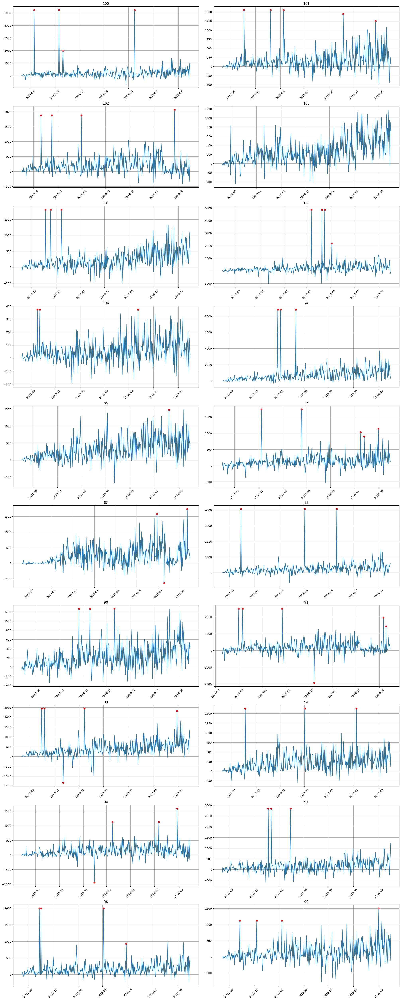

In [151]:

plot_anomalies(ts, get_anomalies_density(ts_1, window_size=7))

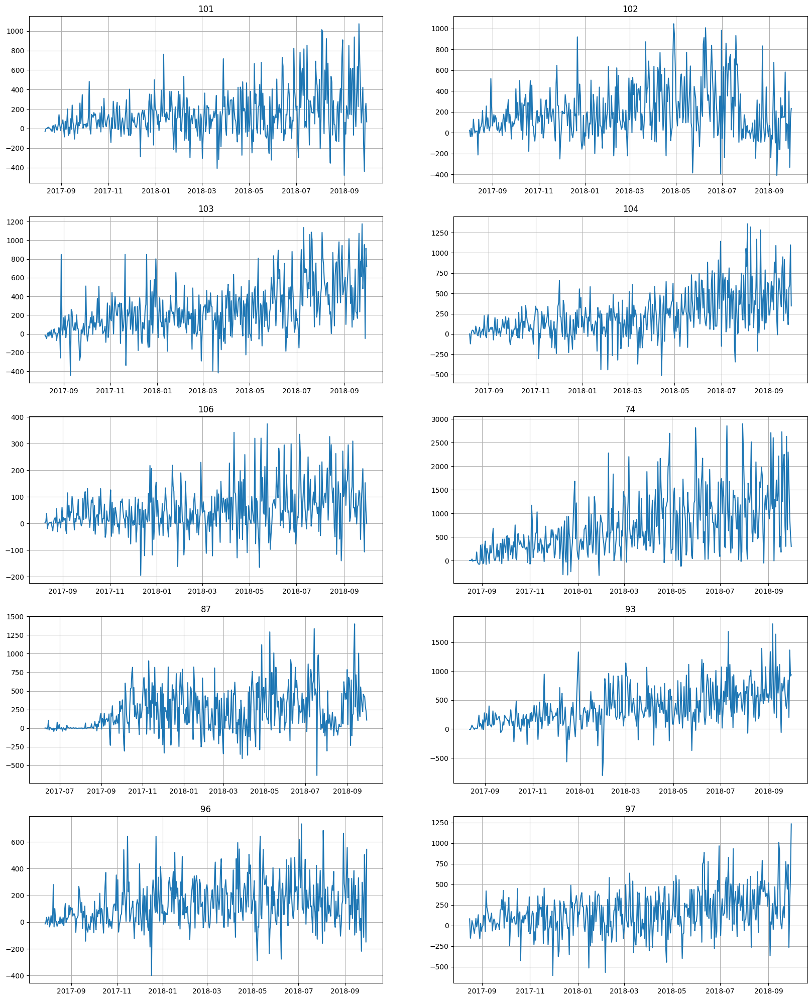

In [153]:

ts.fit_transform([DensityOutliersTransform(in_column="target", window_size=10), TimeSeriesImputerTransform(in_column="target", strategy="running_mean", window=30)])
ts_1.fit_transform([DensityOutliersTransform(in_column="target", window_size=10), TimeSeriesImputerTransform(in_column="target", strategy="running_mean", window=30)])
ts_1.plot()

Проверьте ряды на наличие выбросов, и очистите их соответствующим образом. Обоснуйте выбор.

timestamp    0
segment      0
target       0
dtype: int64


### Задание 3. Построение Prophet (1.25 балла)

Постройте прогнозы с помощью Prophet и `etna.Pipeline`, под капотом `etna.Pipeline` обучит `ProphetModel` для каждого сегмента в отдельности. После этого оцените качество по SMAPE на кросс-валидации. В качестве горизонта предсказания возьмите 5 дней - этого же горизонта будем придерживаться и в дальнейшем.

Отрисуйте получившийся прогноз.

In [90]:
from etna.pipeline import Pipeline
from etna.models import ProphetModel
from etna.metrics import SMAPE, MAE
from etna.analysis import plot_backtest

In [91]:
HORIZON = 5

In [154]:
pipeline = Pipeline(model=ProphetModel(), horizon=HORIZON)
pipeline.fit(ts_1)
metr, forc, fold = pipeline.backtest(ts=ts_1, metrics=[SMAPE()])

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmppfpneedv/no4y8oio.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmppfpneedv/o4p_f9ct.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=79909', 'data', 'file=/tmp/tmppfpneedv/no4y8oio.json', 'init=/tmp/tmppfpneedv/o4p_f9ct.json', 'output', 'file=/tmp/tmppfpneedv/prophet_modelnd71lux0/prophet_model-20240526194519.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:45:19 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:45:19 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonalit

Pipeline(model = ProphetModel(growth = 'linear', changepoints = None, n_changepoints = 25, changepoint_range = 0.8, yearly_seasonality = 'auto', weekly_seasonality = 'auto', daily_seasonality = 'auto', holidays = None, seasonality_mode = 'additive', seasonality_prior_scale = 10.0, holidays_prior_scale = 10.0, changepoint_prior_scale = 0.05, mcmc_samples = 0, interval_width = 0.8, uncertainty_samples = 1000, stan_backend = None, additional_seasonality_params = (), timestamp_column = None, ), transforms = (), horizon = 5, )

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmppfpneedv/67rrm8ba.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmppfpneedv/qw6atj8a.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=45782', 'data', 'file=/tmp/tmppfpneedv/67rrm8ba.json', 'init=/tmp/tmppfpneedv/qw6atj8a.json', 'output', 'file=/tmp/tmppfpneedv/prophet_modelco9pe8n7/prophet_model-20240526194703.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:47:03 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:47:03 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonalit

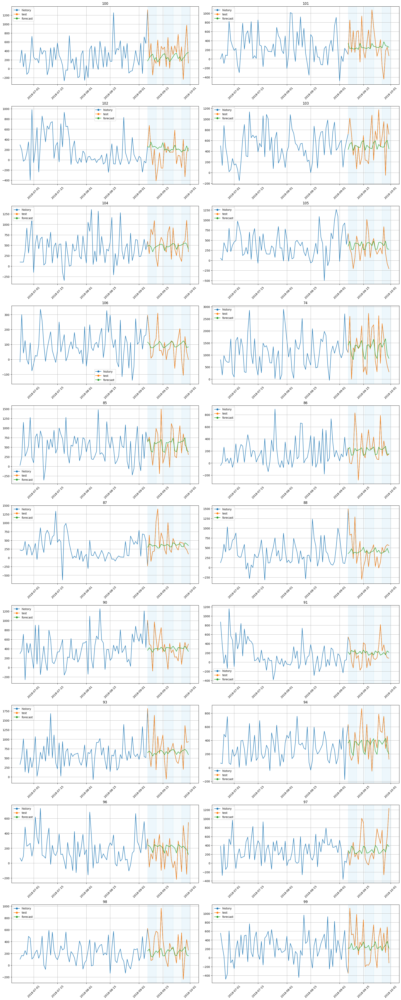

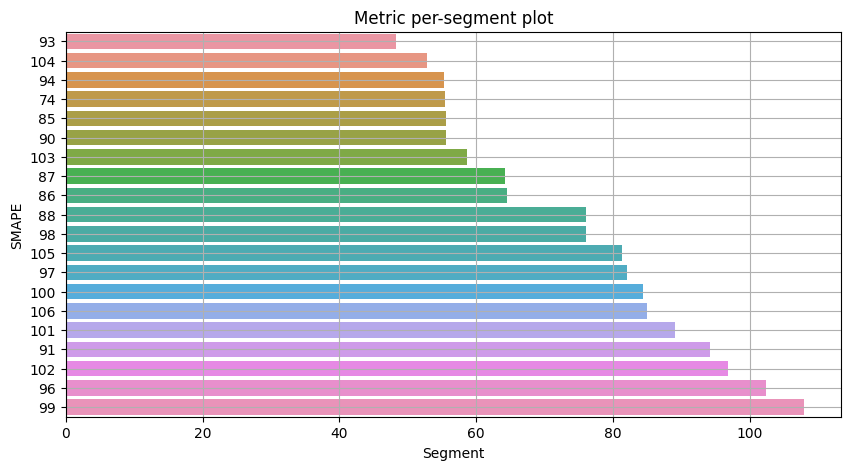

In [159]:
plot_backtest(forc, ts_1, history_len=75)
plot_metric_per_segment(metrics_df=metr, metric_name="SMAPE", ascending=True)

In [160]:
metr, forc, fold = pipeline.backtest(ts=ts_1, metrics=[MAE()])
plot_metric_per_segment(metrics_df=metr, metric_name="MAE", ascending=True)

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmppfpneedv/jgamdmvo.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmppfpneedv/ie1k6qfu.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=33782', 'data', 'file=/tmp/tmppfpneedv/jgamdmvo.json', 'init=/tmp/tmppfpneedv/ie1k6qfu.json', 'output', 'file=/tmp/tmppfpneedv/prophet_modeldvcu3hrz/prophet_model-20240526194955.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:49:55 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:49:55 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonalit

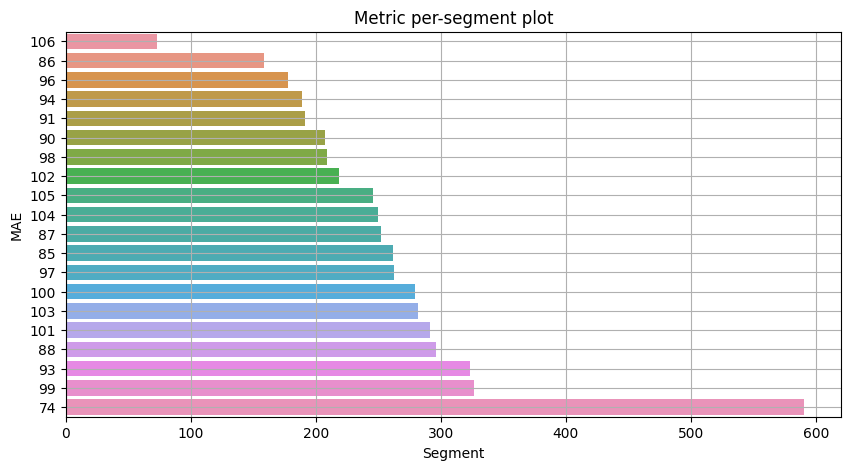

Среднее значение SMAPE: 73.85%.

Высокое значение SMAPE покащывает значительные ошибки прогноза.
значит данные имеют высокую вариативность или модель Prophet недостаточно хорошо подходит для наших данных
мб сильные сезонные колебания или случайные выбросы, которые модель не учитывает должным образом

Среднее значение MAE: 193.54.

 средняя ошибка около 193.54, что также указывает на значительные ошибки в прогнозах

> Добавить блок с цитатой

> Добавить блок с цитатой





Исходя из статистики по каждому ряду, какой можно сделать вывод о том, как лучше предсказывать итоговое значение? Посчитайте то же самое исходя из MAE.

In [ ]:
#YOUR CODE HERE#

### Задание 4. Иерархический временной ряд (2 балла)

Вопрос, поставленный в прошлом задании, тем не менее, естественным образом подводит нас к концепции **иерархического временного ряда** (когда один ряд состоит из других в качестве компонент). Это полезная концепция, которая может встретиться во многих задачах. В этом задании вам предстоит самостоятельно разобраться в деталях ее реализации в ETNA с использованием справочных материалов, предоставляемых библиотекой (как это часто бывает на практике). Они содержатся по следующей ссылке:

https://github.com/etna-team/etna/blob/master/examples/303-hierarchical_pipeline.ipynb

На выходе из первой части задания необходимо получить `TSDataset` с иерархической структурой, а также соответствующий реконсилятор, который позволит собирать искомый ряд из составных компонент. Классы, которые вам понадобятся, импортированы ниже.

In [94]:
from etna.datasets import TSDataset
from etna.reconciliation import TopDownReconciliator
from etna.pipeline import HierarchicalPipeline
from etna.models import ProphetModel
from etna.transforms import TimeSeriesImputerTransform
from etna.metrics import MAE
from etna.analysis import plot_backtest
import pandas as pd
import matplotlib.pyplot as plt

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmppfpneedv/qcd7xmat.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmppfpneedv/z83f73m3.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=24036', 'data', 'file=/tmp/tmppfpneedv/qcd7xmat.json', 'init=/tmp/tmppfpneedv/z83f73m3.json', 'output', 'file=/tmp/tmppfpneedv/prophet_model0sxmb_4i/prophet_model-20240526195236.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:52:36 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:52:36 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
[Parallel(n_jobs=1)]: Done   1 tasks    

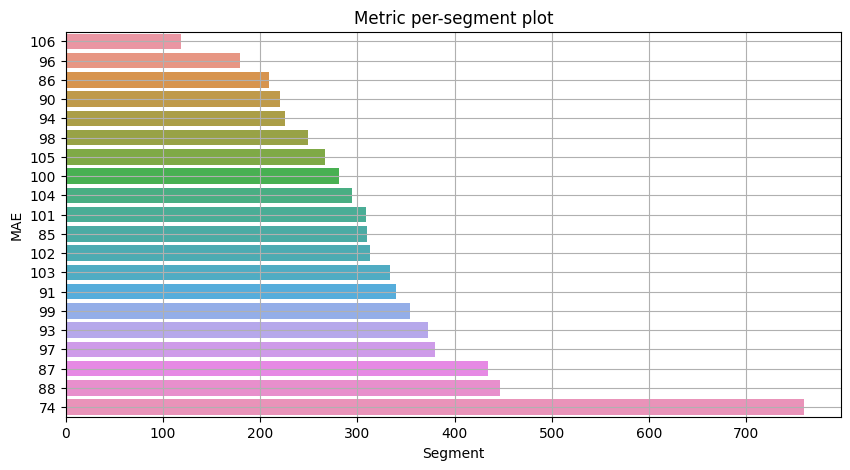

In [162]:
df['operation_value'] += abs(df['operation_value'].min())
hierarchical_structure = HierarchicalStructure(level_structure={"total": list(map(str, df['atm_id'].unique().tolist()))}, level_names=["total", "atm"])
hierarchical_ts = TSDataset(df=df.rename(columns={'datetime': 'timestamp', 'atm_id': 'segment', 'operation_value': 'target'}), freq="D", hierarchical_structure=hierarchical_structure)
reconciliator = TopDownReconciliator(target_level="atm", source_level="total", method="AHP", period=5)
outliers_remover = DensityOutliersTransform(in_column="target", window_size=10)
outliers_imputer = TimeSeriesImputerTransform(in_column="target", strategy="running_mean", window=30)
pipeline = HierarchicalPipeline(transforms=[TimeSeriesImputerTransform(), outliers_remover, outliers_imputer,],model=ProphetModel(),reconciliator=reconciliator,horizon=HORIZON)
ahp_metrics, _, _ = pipeline.backtest(ts=hierarchical_ts, metrics=[MAE()])
plot_metric_per_segment(metrics_df=ahp_metrics, metric_name="MAE", ascending=True)

Во второй части задания примените найденные на предыдущих этапах преобразования очистку от выбросов уже к иерархическому датасету, и запустите на нем Prophet с MAE на кросс-валидации.

### Задание 5. Построение признаков (1.5 балла)

Вернемся к нашему исходному мультисегментному ряду - теперь поработаем с моделями, которые требуют построения признаков - `ARIMA` и `CatBoost`. Построим для них признаки, и попробуем при помощи них добиться улучшения качества.

Из обязательного:
1) постройте графики автокорреляции и при помощи них обоснуйте выбор лаговых признаков
2) для катбуста включите в признаки результаты STL разложения. STL используем для убирания тренда за счет преобразования на месте.
* Кроме этого, подумайте на экспертном уровне,
    - Какие еще закономерности могут присутствовать и почему?
    - Что из этого кажется более предсказуемым, и почему?
    - Cделайте соответствующие признаки, и снабдите их кратким комментарием.

3) После этого, обучите на получившихся признаках модели. Для `CatBoost` рассмотрите 2 версии мультисегментную и на каждый ряд в отдельности.

Ниже приведены импорты, которые вам точно понадобятся - к ним необходимо добавить те инструменты, которые вы дополнительно решите использовать в анализе.

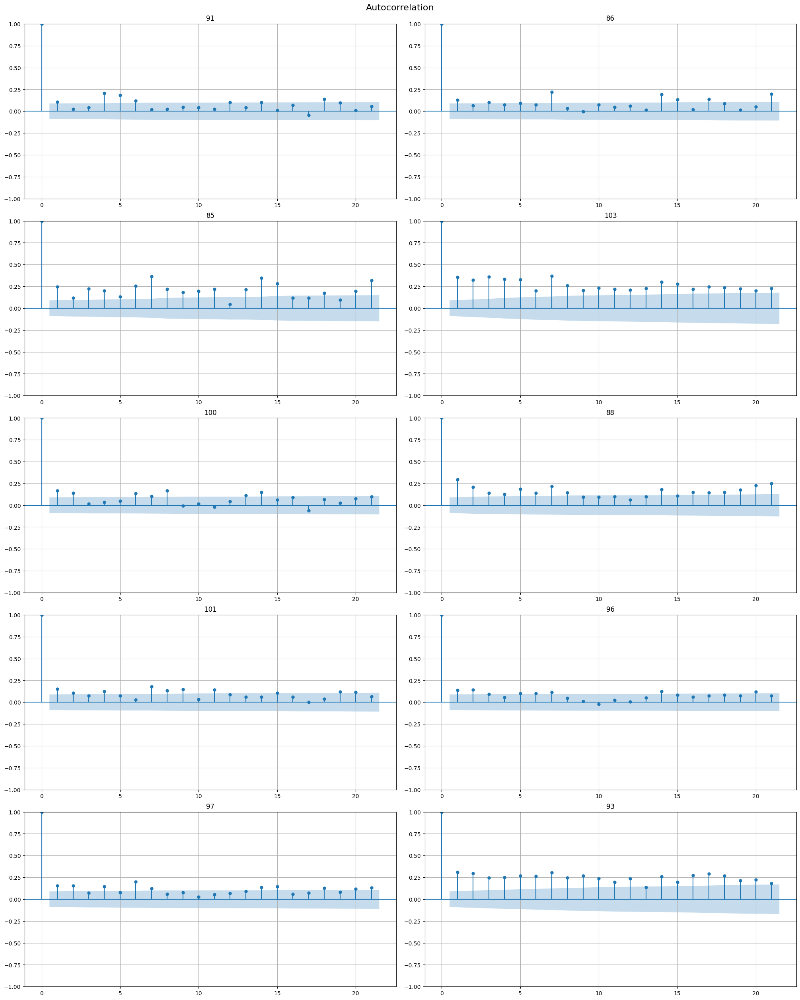

In [163]:
from etna.analysis import acf_plot, stl_plot
from etna.ensembles import DirectEnsemble, StackingEnsemble, VotingEnsemble
from etna.models import (CatBoostMultiSegmentModel, CatBoostPerSegmentModel,
                         AutoARIMAModel)
from etna.transforms import STLTransform, LagTransform, SegmentEncoderTransform, DateFlagsTransform
acf_plot(ts_1)


In [128]:
берем 6 14 и 15

AttributeError: 'DataFrame' object has no attribute 'segments'

берем 6 14 и 15 как наиболее популярные

In [165]:
pipeline = Pipeline(transforms=[DateFlagsTransform(day_number_in_week=True,day_number_in_month=True,week_number_in_month=True,week_number_in_year=True,month_number_in_year=True,special_days_in_week=[5, 6],),SegmentEncoderTransform(),LagTransform(in_column="target", lags=[6, 14, 15])],model=AutoARIMAModel(),horizon=HORIZON)
metrics, forecast, _ = pipeline.backtest(ts=ts_1, metrics=[MAE()], n_jobs=2)
plot_metric_per_segment(metrics_df=metr, metric_name="MAE", ascending=True)

[Parallel(n_jobs=2)]: Using backend MultiprocessingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done   1 tasks      | elapsed:   51.7s
[Parallel(n_jobs=2)]: Done   2 tasks      | elapsed:   57.0s
[Parallel(n_jobs=2)]: Done   3 out of   5 | elapsed:  1.9min remaining:  1.3min
[Parallel(n_jobs=2)]: Done   5 out of   5 | elapsed:  3.6min finished
[Parallel(n_jobs=2)]: Using backend MultiprocessingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done   1 tasks      | elapsed:    5.7s
[Parallel(n_jobs=2)]: Done   2 tasks      | elapsed:    6.4s
[Parallel(n_jobs=2)]: Done   3 out of   5 | elapsed:   14.3s remaining:    9.5s
[Parallel(n_jobs=2)]: Done   5 out of   5 | elapsed:   17.6s finished
[Parallel(n_jobs=2)]: Using backend MultiprocessingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done   1 tasks      | elapsed:    0.5s
[Parallel(n_jobs=2)]: Done   2 tasks      | elapsed:    1.4s
[Parallel(n_jobs=2)]: Done   3 out of   5 | elapsed:    2.2s remaining:    1

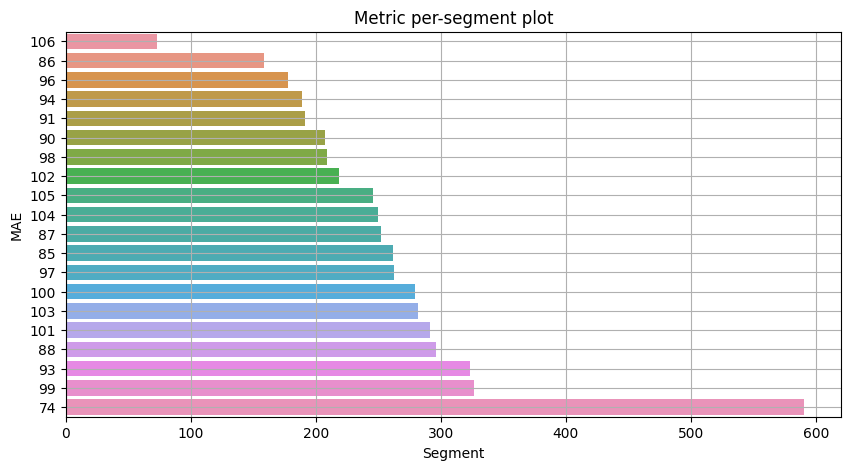

In [166]:
plot_metric_per_segment(metrics_df=metr, metric_name="MAE", ascending=True)

чуть ниже мае

[Parallel(n_jobs=2)]: Using backend MultiprocessingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done   1 tasks      | elapsed:   36.4s
[Parallel(n_jobs=2)]: Done   2 tasks      | elapsed:   36.8s
[Parallel(n_jobs=2)]: Done   3 out of   5 | elapsed:  1.2min remaining:   48.6s
[Parallel(n_jobs=2)]: Done   5 out of   5 | elapsed:  1.5min finished
[Parallel(n_jobs=2)]: Using backend MultiprocessingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done   1 tasks      | elapsed:    9.1s
[Parallel(n_jobs=2)]: Done   2 tasks      | elapsed:    9.8s
[Parallel(n_jobs=2)]: Done   3 out of   5 | elapsed:   19.9s remaining:   13.3s
[Parallel(n_jobs=2)]: Done   5 out of   5 | elapsed:   25.2s finished
[Parallel(n_jobs=2)]: Using backend MultiprocessingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done   1 tasks      | elapsed:    2.1s
[Parallel(n_jobs=2)]: Done   2 tasks      | elapsed:    3.2s
[Parallel(n_jobs=2)]: Done   3 out of   5 | elapsed:    3.6s remaining:    2

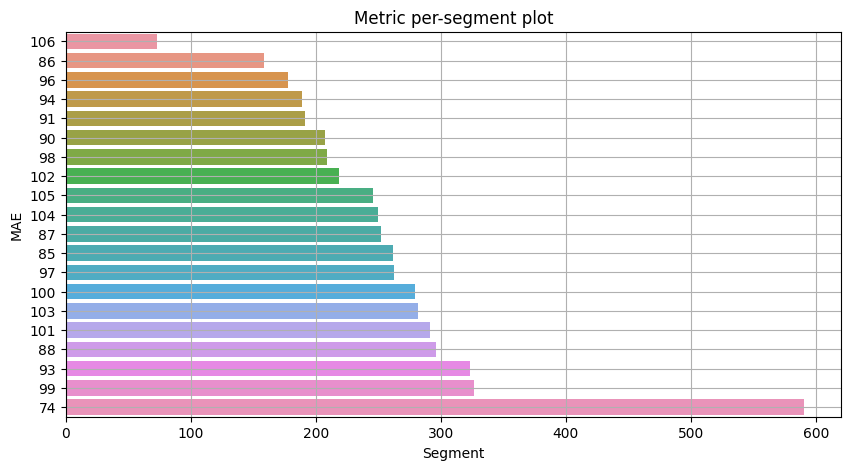

In [168]:
pipeline = Pipeline(transforms=[DateFlagsTransform(day_number_in_week=True,day_number_in_month=True,week_number_in_month=True,week_number_in_year=True,month_number_in_year=True,special_days_in_week=[5, 6],),STLTransform(in_column="target", period=10),SegmentEncoderTransform(),LagTransform(in_column="target", lags=[5, 6, 14, 15])],model=CatBoostMultiSegmentModel(),horizon=HORIZON)
metrics, forecast, _ = pipeline.backtest(ts=ts_1, metrics=[MAE()], n_jobs=2)
plot_metric_per_segment(metrics_df=metr, metric_name="MAE", ascending=True)

мае выше

[Parallel(n_jobs=2)]: Using backend MultiprocessingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done   1 tasks      | elapsed:  3.1min
[Parallel(n_jobs=2)]: Done   2 tasks      | elapsed:  3.1min
[Parallel(n_jobs=2)]: Done   3 out of   5 | elapsed:  6.1min remaining:  4.1min
[Parallel(n_jobs=2)]: Done   5 out of   5 | elapsed:  7.5min finished
[Parallel(n_jobs=2)]: Using backend MultiprocessingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done   1 tasks      | elapsed:   11.5s
[Parallel(n_jobs=2)]: Done   2 tasks      | elapsed:   12.7s
[Parallel(n_jobs=2)]: Done   3 out of   5 | elapsed:   20.7s remaining:   13.8s
[Parallel(n_jobs=2)]: Done   5 out of   5 | elapsed:   28.1s finished
[Parallel(n_jobs=2)]: Using backend MultiprocessingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done   1 tasks      | elapsed:    1.6s
[Parallel(n_jobs=2)]: Done   2 tasks      | elapsed:    2.5s
[Parallel(n_jobs=2)]: Done   3 out of   5 | elapsed:    2.9s remaining:    2

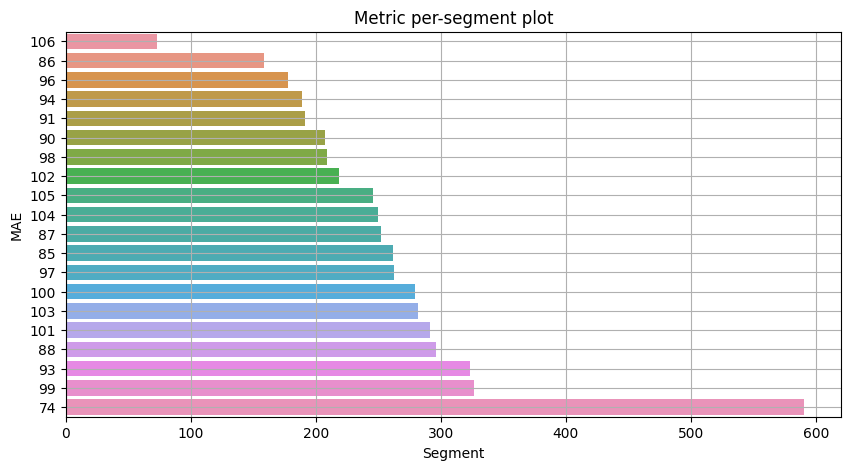

In [169]:
pipeline = Pipeline(transforms=[DateFlagsTransform(day_number_in_week=True,day_number_in_month=True,week_number_in_month=True,week_number_in_year=True,month_number_in_year=True,special_days_in_week=[5, 6],),STLTransform(in_column="target", period=10),SegmentEncoderTransform(),LagTransform(in_column="target", lags=[5, 6, 14, 15])],model=CatBoostPerSegmentModel(),horizon=HORIZON)
metrics, forecast, _ = pipeline.backtest(ts=ts_1, metrics=[MAE()], n_jobs=2)
plot_metric_per_segment(metrics_df=metr, metric_name="MAE", ascending=True)

In [170]:
все еще хуже ARIMA
зависимость можно также увидеть с тем в какие дни нужны банкоматы больше

SyntaxError: invalid syntax (<ipython-input-170-cf07f69a9af7>, line 1)

### Задание 6. Стратегии прогнозирования (1.25 балла)

Как нам известно по семинарским занятиям, при построении прогноза на горизонте дальше следующего наблюдения перед нами встает задача определиться со стратегией генерации прогноза. Попробуйте разные стратегии на нашем горизонте из 5 дней (прямая, рекурсивная). Какая стратегия в совокупности с какой моделью дает лучший результат?

Учитывайте особенности, которые некоторые стратегии могут накладывать на признаки (в частности, на лаговые переменные).

При необходимости, в смешанном методе пользуйтесь упрощенной схемой спецификации моделей/преобразований.

In [171]:
from etna.pipeline import AutoRegressivePipeline, Pipeline, assemble_pipelines
from etna.ensembles import DirectEnsemble

In [ ]:
model = CatBoostPerSegmentModel()

transforms=[DateFlagsTransform(day_number_in_week=True,day_number_in_month=True,week_number_in_month=True,week_number_in_year=True,month_number_in_year=True,special_days_in_week=[5, 6],),STLTransform(in_column="target", period=10),SegmentEncoderTransform(),LagTransform(in_column="target", lags=[5, 6, 14, 15])]

autoregressivepipeline = AutoRegressivePipeline(model=model, transforms=transforms, horizon=HORIZON, step=1)
metr, forс, _ = autoregressivepipeline.backtest(ts=ts_1, metrics=[MAE()])
autoregressive_pipeline_metrics = metr.mean()
plot_metric_per_segment(metr, metric_name='MAE', ascending=True)
plot_backtest(forс, ts, history_len=15)

[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:  1.2min


предыдущий подход был более успешен

### Задание 7. Ансамбли (1.25 балла)

Чтобы не выбирать лучшую модель, мы можем использовать преимущества каждой - давайте объединим все наши наработки в ансамбль. Попробуйте различные опции ансамблирования, и выберите ту, которая работает лучше всего (не забывайте, что внутри каждого ансамбля у нас тоже есть параметры, которые мы можем варьировать - веса в voting, включаемые признаки в stacking).

In [ ]:
from etna.ensembles import StackingEnsemble, VotingEnsemble

In [ ]:
pipeline1 = Pipeline(transforms=[DateFlagsTransform(day_number_in_week=True,day_number_in_month=True,week_number_in_month=True,week_number_in_year=True,month_number_in_year=True,special_days_in_week=[5, 6],),SegmentEncoderTransform(),LagTransform(in_column="target", lags=[5, 6, 14, 15])],model=AutoARIMAModel(),horizon=HORIZON)

pipeline2 = Pipeline(transforms=[DateFlagsTransform(day_number_in_week=True,day_number_in_month=True,week_number_in_month=True,week_number_in_year=True,month_number_in_year=True,special_days_in_week=[5, 6],),STLTransform(in_column="target", period=10),SegmentEncoderTransform(),LagTransform(in_column="target", lags=[5, 6, 14, 15])],model=CatBoostPerSegmentModel(),horizon=HORIZON)

pipeline3 = Pipeline(transforms=[DateFlagsTransform(day_number_in_week=True,day_number_in_month=True, week_number_in_month=True,week_number_in_year=True,month_number_in_year=True,special_days_in_week=[5, 6],),SegmentEncoderTransform(),LagTransform(in_column="target", lags=[5, 6, 14, 15])],model=CatBoostPerSegmentModel(),horizon=HORIZON)
pipelines = [pipeline1, pipeline2, pipeline3]
voting_ensemble = VotingEnsemble(pipelines=pipelines)
voting_ensamble_metrics = voting_ensemble.backtest(ts=ts_1,metrics=[MAE()],n_folds=5,aggregate_metrics=True,)[0].iloc[:, 1:]
voting_ensamble_metrics.index = ts_w_nona.df._mgr.items.levels[0]
voting_ensamble_metrics.sort_values('MAE', ascending=False).plot(kind='barh', grid=True)

арима все же лучше

### Задание 8*. Трансформер (бонус 2 балла)

Для желающих протестировать мощь трансформенных моделей предлагается "завести" модель из второго семинара по временным рядам на текущем датасете. На этот раз абсолютно все необходимые импорты и зависимости подгружаются на ваше усмотрение. Удалось ли вам улучшить качество по сравнению с классическими моделями / моделями на основе ML? Что бы вы предпочли внедрить в production?

*NB:* все, конечно, прекрасно знают механизм работы бонусных заданий, но порядка ряди прописать дисклеймер должны - итоговый балл за домашнее задание ставится по формуле min(10, ваш суммарный балл за задания).

In [ ]:
не успелаааааааааааааа вот интересный факт дня: у сов очень длинные ноги под брюхом